In [1]:
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from gensim.models import LdaModel
import pandas as pd
import ecopy as ep
import seaborn as sns
from scipy import stats

In [2]:
nTopics = 45

In [3]:
topic_names = [
'Water Quality',
'Sediment Transport',
'Wastewater Treatment',
'Flood Risk & Assessment',
'Hydrogeology',
'Coastal Hydrology', 
'River Flow',
'Wetland & Ecology',
'Runoff Quality',
'Rainfall-Runoff',
'Urban Drainage',
'Systems Hydrology',
'Surface-GW Interactions',
'Irrigation Water Management',
'Drought & Water Scarcity',
'Climate Change Impacts',
'Gauging & Monitoring',
'Forecasting',
'Glaciology',
'Salinity',
'Peatlands Mapping & Monitoring',
'Spatial Variability',
'Land Surface Flux',
'Solute Transport',
'Water Resources Management',
'Numerical Modeling',
'Hydrochemistry',
'Pollutant Removal',
'Groundwater Recharge',
'Uncertainty',
'Land Cover',
'Modeling & Calibration',
'Soil Moisture',
'Water Storage & Budgeting',
'Aquifers & Abstraction',
'Microbiology',
'Streamflow',
'Erosion',
'Dynamic Processes',
'Temporal Variability',
'Spatial Variability of Precipitation',
'Rainfall Intensity & Measurement',
'Watershed Hydrology',
'Hydraulics',
'Quantitative Analysis',
]

In [4]:
topic_names_short = [
'WQ',
'SDT',
'WT',
'FRA',
'HG',
'CH', 
'RF',
'WE',
'RQ',
'RR',
'UD',
'SH',
'SGW',
'IWM',
'DWS',
'CC',
'GM',
'FC',
'GL',
'SN',
'PM',
'SV',
'LSF',
'SLT',
'WRM',
'NM',
'HC',
'PR',
'GWR',
'UC',
'LC',
'MDC',
'SM',
'WSB',
'AA',
'MCB',
'SF',
'ER',
'DP',
'TV',
'SVP',
'RIM',
'WH',
'HDR',
'QA',
]

In [5]:
# Define colors to associate with each topic
custom_colors = {
 'burlywood': '#DEB887',
 'chocolate': '#D2691E',
 'crimson': '#DC143C',
 'darkgreen': '#006400',
 'darkorange': '#FF8C00',
 'darkslategrey': '#2F4F4F',
 'deepskyblue': '#00BFFF',
 'dimgray': '#696969',
 'firebrick': '#B22222',
 'gold': '#FFD700',
 'goldenrod':'#DAA520',
 'lawngreen':'#7CFC00',
 'rosybrown':'#BC8F8F',
 'mediumslateblue':'#7B68EE',
 'mediumvioletred': '#C71585',
 'orangered': '#FF4500',
 'orchid': '#DA70D6',
 'royalblue': '#4169E1',
 'slateblue': '#6A5ACD',
 'springgreen': '#00FF7F',
 'steelblue': '#4682B4',
 'teal': '#008080',
 'turquoise': '#40E0D0',
 'yellow': '#FFFF00',
 'blueviolet': '#8A2BE2',
 'yellowgreen': '#9ACD32',
 'mistyrose': '#FFE4E1',
 'royalblue': '#4169E1',
 'lavender':  '#E6E6FA',
 'seashell': '#FFF5EE',
 'coral':'#FF7F50',
 'magenta':'#FF00FF',
 'moccasin':'#FFE4B5',
 'navy':'#000080',
 'paleturquoise':'#AFEEEE',
 'aliceblue':'#F0F8FF',
 'azure':'#F0FFFF',
 'khaki':'#F0E68C',
 'lightseagreen':'#20B2AA',
 'linen':'#FAF0E6',
 'palevioletred':'#DB7093',
 'sienna':'#A0522D',
 'mediumspringgreen':'#00FA9A',
 'indianred':'#CD5C5C',
 'tomato': '#FF6347',
}

# turn into a list
colorlist = []
for color in custom_colors.values():
    colorlist.append(tuple(int(color.lstrip('#')[i:i+2], 16) for i in (0, 2, 4)))

In [6]:
color_key_dict = {
'Water Quality':'burlywood',
'Sediment Transport':'chocolate',
'Wastewater Treatment':'crimson',
'Flood Risk & Assessment':'darkgreen',
'Hydrogeology':'darkorange',
'Coastal Hydrology':'darkslategrey', 
'River Flow':'deepskyblue',
'Wetland & Ecology':'dimgray',
'Runoff Quality':'firebrick',
'Rainfall-Runoff':'gold',
'Urban Drainage':'goldenrod',
'Systems Hydrology':'lawngreen',
'Surface-GW Interactions':'rosybrown',
'Irrigation Water Management':'mediumslateblue',
'Drought & Water Scarcity':'mediumvioletred',
'Climate Change Impacts':'orangered',
'Gauging & Monitoring':'orchid',
'Forecasting':'royalblue',
'Glaciology':'slateblue',
'Salinity':'springgreen',
'Peatlands Mapping & Monitoring':'steelblue',
'Spatial Variability':'teal',
'Land Surface Flux':'turquoise',
'Solute Transport':'yellow',
'Water Resources Management':'blueviolet',
'Numerical Modeling':'yellowgreen',
'Hydrochemistry':'mistyrose',
'Pollutant Removal':'royalblue',
'Groundwater Recharge':'lavender',
'Uncertainty':'seashell',
'Land Cover':'coral',
'Modeling & Calibration':'magenta',
'Soil Moisture':'moccasin',
'Water Storage & Budgeting':'navy',
'Aquifers & Abstraction':'paleturquoise',
'Microbiology':'aliceblue',
'Streamflow':'azure',
'Erosion':'khaki',
'Dynamic Processes':'lightseagreen',
'Temporal Variability':'linen',
'Spatial Variability of Precipitation':'palevioletred',
'Rainfall Intensity & Measurement':'sienna',
'Watershed Hydrology':'mediumspringgreen',
'Hydraulics':'indianred',
'Quantitative Analysis':'tomato',
}


In [7]:
# Load model

lda_model = LdaModel.load(f'trained_models/trained_lda_model_new_{nTopics}')



# Load topic distributions

topic_distributions = np.load(f'data/topic_distributions_broad_{lda_model.num_topics}.npy')



# Pull topics

topics = lda_model.show_topics(formatted=False, num_topics=nTopics, num_words=20)



# load raw corpus dataframe

with open('data/raw_corpus_broad.pkl', 'rb') as f:
    corpus_df = pkl.load(f)

In [8]:
# Pull journals

journals = corpus_df.Journal.unique()



# Pull years

years = np.unique(corpus_df['Year'])

In [9]:
# Create a dictionary of topic distributions by year
#topic_distributions_year['Year'][paper][topic_weights]

topic_distributions_year = {}

for y, year in enumerate(years):
    
    topic_distributions_year[year] = topic_distributions[corpus_df['Year'] == year]


In [10]:
topic_distributions_year['2011'].shape

(3170, 45)

In [11]:
# Create a dictionary of topic distributions by journal
# topic_distributions_journal['Journal'][paper][topic_weights]

topic_distributions_journal = {}

for j, journal in enumerate(journals):
    
    topic_distributions_journal[journal] = topic_distributions[corpus_df['Journal'] == journal]
    

In [12]:
topic_distributions_journal['HESS'][:,44]

array([0., 0., 0., ..., 0., 0., 0.])

In [13]:
# Create a dictionary of topic distributions by year & journal
# topic_distributions_journal_year['Journal']['Year]'[paper][topic_weights]

topic_distributions_journal_year = {}

for j, journal in enumerate(journals):
    
    topic_distributions_journal_year[journal] = {}
    
    for y, year in enumerate(years):
        
        topic_distributions_journal_year[journal][year] = topic_distributions[(corpus_df['Journal'] == journal) & (corpus_df['Year'] == year)]


In [14]:
# Create a dictionary of topic distributions by individual to

In [15]:
# Define a list of diversity metrics for ecopy

diversity_metrics = ['shannon', 'spRich', 'gini-simpson', 'dominance']

In [16]:
# Global diversity metrics
#global_diversity['metric'][paper_diversities]


global_diversity = {}

for metric in diversity_metrics:
    
    global_diversity[metric] = ep.diversity(topic_distributions, method = metric, breakNA=False, num_equiv=False)


In [17]:
# Yearwise diversity metric
# year_diversity['metric']['year'][paper_diversities]

year_diversity = {}


for metric in diversity_metrics:
    
    year_diversity[metric] = {}
    
    for y, year in enumerate(years):
        
        year_diversity[metric][year] = ep.diversity(topic_distributions_year[year], method = metric, breakNA=False, num_equiv=False)


In [18]:
# Journalwise diversity metric
# year_diversity['metric']['journal'][paper_diversities]

journal_diversity = {}

for metric in diversity_metrics:
    
    journal_diversity[metric] = {}
    
    for j, journal in enumerate(journals):
        
        journal_diversity[metric][journal] = ep.diversity(topic_distributions_journal[journal], method = metric, breakNA=False, num_equiv=False)

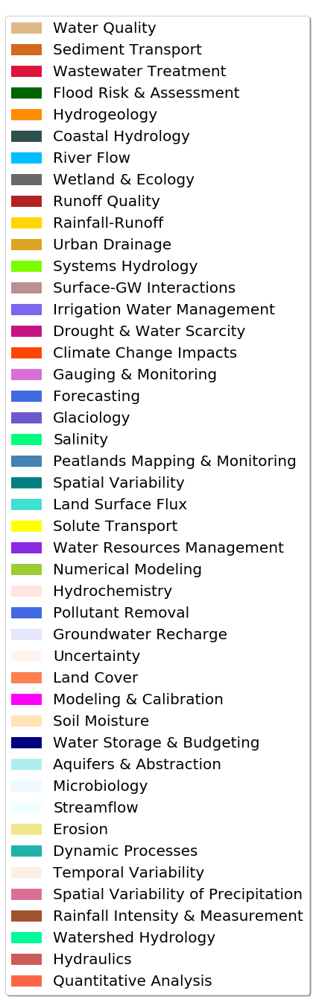

In [19]:
#creating proxy artist for legends        
labels = list(color_key_dict.keys())
handles = [plt.Rectangle((0,0),1,1, color=color_key_dict[label]) for label in labels]
plt.axis('off')
plt.legend(handles, labels, shadow = True, fancybox = True, prop={'size': 20})
plt.savefig('figures/legends.png')  


In [20]:
#Calculate r values per metric and plotting them.

r_vals_global = {}


for metric in diversity_metrics:
    
    r_vals_global[metric] = {}
    
    for t, topic in enumerate(topic_names):

        r_vals_global[metric][topic] = np.corrcoef(topic_distributions[:,t],global_diversity[metric])[0,1]

        
# Make the graph 20 inches by 40 inches
fig = plt.figure(figsize=(250,150), facecolor='white')


# plot numbering starts at 1, not 0
plot_number = 1

for metric in diversity_metrics:
    ax = fig.add_subplot(2, 2, plot_number)
    ax.bar(topic_names_short, r_vals_global[metric].values(), color = list(custom_colors.values()))
    ax.tick_params(axis="x", labelsize=50)
    ax.tick_params(axis="y", labelsize=100)
    ax.set_title(metric, size = 150)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1

plt.tight_layout()
plt.savefig('figures/r_allmetrics_fullcorpus.png')    

### statistical relationship between paper-topic distributions and diversities by journal

In [21]:
#Create a dictionary of [metric][journal][topic][weights]
journal_diversity_correlation_dict = {}


    
for metric in diversity_metrics:

    journal_diversity_correlation_dict[metric] = {}

    for j, journal in enumerate(journals):

        journal_diversity_correlation_dict[metric][journal] = {}

        
        for t, topic in enumerate(topic_names):

            journal_diversity_correlation_dict[metric][journal][topic] = np.corrcoef(topic_distributions_journal[journal][:,t],journal_diversity[metric][journal])[0,1]
            
            


In [22]:
# Make the graph 20 inches by 40 inches
fig = plt.figure(figsize=(250,150), facecolor='white')


# plot numbering starts at 1, not 0
plot_number = 1

for journal in journals:
    ax = fig.add_subplot(6, 3, plot_number)
    ax.bar(topic_names_short, journal_diversity_correlation_dict['shannon'][journal].values(), color = list(custom_colors.values()))
    ax.tick_params(axis="x", labelsize=50)
    ax.tick_params(axis="y", labelsize=100)
    ax.set_title(journal, size = 150)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1

plt.tight_layout()
plt.savefig('figures/r_shannon_alljournals.png')    

In [37]:
fig = plt.figure(figsize=(250,150), facecolor='white')


# plot numbering starts at 1, not 0
plot_number = 1

for journal in journals:
    ax = fig.add_subplot(6, 3, plot_number)
    ax.bar(topic_names_short, journal_diversity_correlation_dict['gini-simpson'][journal].values(), color = list(custom_colors.values()))
    ax.tick_params(axis="x", labelsize=50)
    ax.tick_params(axis="y", labelsize=100)
    ax.set_title(journal, size = 150)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1

plt.tight_layout()
plt.savefig('figures/r_gini_alljournals.png')    

In [38]:
fig = plt.figure(figsize=(250,150), facecolor='white')


# plot numbering starts at 1, not 0
plot_number = 1

for journal in journals:
    ax = fig.add_subplot(6, 3, plot_number)
    ax.bar(topic_names_short, journal_diversity_correlation_dict['spRich'][journal].values(), color = list(custom_colors.values()))
    ax.tick_params(axis="x", labelsize=50)
    ax.tick_params(axis="y", labelsize=100)
    ax.set_title(journal, size = 150)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1

plt.tight_layout()
plt.savefig('figures/r_sprich_alljournals.png')    

In [39]:
fig = plt.figure(figsize=(250,150), facecolor='white')


# plot numbering starts at 1, not 0
plot_number = 1

for journal in journals:
    ax = fig.add_subplot(6, 3, plot_number)
    ax.bar(topic_names_short, journal_diversity_correlation_dict['dominance'][journal].values(), color = list(custom_colors.values()))
    ax.tick_params(axis="x", labelsize=50)
    ax.tick_params(axis="y", labelsize=100)
    ax.set_title(journal, size = 150)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1

plt.tight_layout()
plt.savefig('figures/r_dominance_alljournals.png')    

### statistical relationship between paper-topic distributions and diversities by year ###

In [23]:
#Creating topicwise distribution dictionary
#topicwise_dist_dict[paper][topic]

topicwise_year_dict = {}

for y, year in enumerate(years):
    
    topicwise_year_dict[year] = {}

    for p in range(len(topic_distributions_year[year])):

        topicwise_year_dict[year][p] = {}

        for t, topic in enumerate(topic_names):

            topicwise_year_dict[year][p][topic] = topic_distributions_year[year][p][t]

In [24]:
topicwise_year_dict['2011'][1]

{'Water Quality': 0.04757729917764664,
 'Sediment Transport': 0.0,
 'Wastewater Treatment': 0.0,
 'Flood Risk & Assessment': 0.0,
 'Hydrogeology': 0.0,
 'Coastal Hydrology': 0.025050777941942215,
 'River Flow': 0.0,
 'Wetland & Ecology': 0.0,
 'Runoff Quality': 0.0,
 'Rainfall-Runoff': 0.0,
 'Urban Drainage': 0.0,
 'Systems Hydrology': 0.0,
 'Surface-GW Interactions': 0.0,
 'Irrigation Water Management': 0.0,
 'Drought & Water Scarcity': 0.0,
 'Climate Change Impacts': 0.5470227003097534,
 'Gauging & Monitoring': 0.1531810611486435,
 'Forecasting': 0.0,
 'Glaciology': 0.0,
 'Salinity': 0.0,
 'Peatlands Mapping & Monitoring': 0.0,
 'Spatial Variability': 0.0,
 'Land Surface Flux': 0.0,
 'Solute Transport': 0.0,
 'Water Resources Management': 0.0,
 'Numerical Modeling': 0.0,
 'Hydrochemistry': 0.0,
 'Pollutant Removal': 0.051370564848184586,
 'Groundwater Recharge': 0.0,
 'Uncertainty': 0.0832846388220787,
 'Land Cover': 0.0,
 'Modeling & Calibration': 0.0,
 'Soil Moisture': 0.0,
 'Water

In [25]:
#dictionary of dataframes for individual years
df_year_weights_dict = {}

for y, year in enumerate(years):
    df_year_weights_dict[year] = (pd.DataFrame(topicwise_year_dict[year])).transpose()

df_year_weights_dict['2011']['Climate Change Impacts']

0       0.000000
1       0.547023
2       0.000000
3       0.000000
4       0.105778
5       0.000000
6       0.000000
7       0.000000
8       0.144229
9       0.000000
10      0.000000
11      0.000000
12      0.000000
13      0.046178
14      0.405017
15      0.000000
16      0.039554
17      0.298825
18      0.069396
19      0.000000
20      0.000000
21      0.000000
22      0.047993
23      0.324496
24      0.000000
25      0.000000
26      0.000000
27      0.065724
28      0.000000
29      0.000000
          ...   
3140    0.000000
3141    0.000000
3142    0.000000
3143    0.000000
3144    0.000000
3145    0.000000
3146    0.000000
3147    0.029962
3148    0.000000
3149    0.000000
3150    0.000000
3151    0.062491
3152    0.000000
3153    0.000000
3154    0.000000
3155    0.000000
3156    0.000000
3157    0.000000
3158    0.065578
3159    0.000000
3160    0.000000
3161    0.000000
3162    0.000000
3163    0.027773
3164    0.000000
3165    0.000000
3166    0.000000
3167    0.0000

In [26]:
#Use this dictionary to iterate over year and topic names for r-sq calculations

year_topicwise_dict = {}

for y, year in enumerate(years):
    year_topicwise_dict[year] = {}
    for t, topic in enumerate(topic_names):
        year_topicwise_dict[year][topic] = np.array(df_year_weights_dict[year][topic])

year_topicwise_dict['2011']


{'Water Quality': array([0.0448508 , 0.0475773 , 0.        , ..., 0.09702475, 0.52264363,
        0.        ]),
 'Sediment Transport': array([0.        , 0.        , 0.16877618, ..., 0.01061917, 0.01414442,
        0.01620267]),
 'Wastewater Treatment': array([0.        , 0.        , 0.        , ..., 0.        , 0.01263306,
        0.        ]),
 'Flood Risk & Assessment': array([0.        , 0.        , 0.01277706, ..., 0.        , 0.        ,
        0.        ]),
 'Hydrogeology': array([0.        , 0.        , 0.        , ..., 0.11067589, 0.08122005,
        0.07694485]),
 'Coastal Hydrology': array([0.        , 0.02505078, 0.        , ..., 0.03291803, 0.        ,
        0.        ]),
 'River Flow': array([0.        , 0.        , 0.04219456, ..., 0.        , 0.        ,
        0.        ]),
 'Wetland & Ecology': array([0.        , 0.        , 0.        , ..., 0.05983808, 0.0103288 ,
        0.        ]),
 'Runoff Quality': array([0.03480456, 0.        , 0.        , ..., 0.07105567,

In [27]:
#year_diversity_correlation_dict[metric][year][topic][rsq]
year_diversity_correlation_dict = {}


for metric in diversity_metrics:

    year_diversity_correlation_dict[metric] = {}

    for y, year in enumerate(years):

        year_diversity_correlation_dict[metric][year] = {}

        for t, topic in enumerate(topic_names):

            year_diversity_correlation_dict[metric][year][topic] = np.corrcoef(year_topicwise_dict[year][topic],year_diversity[metric][year])[0,1]

/home/mashrekur/.local/lib/python3.7/site-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/mashrekur/.local/lib/python3.7/site-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


In [28]:
year_diversity_correlation_dict['shannon']['2011'].values()

dict_values([0.038465020187833446, 0.10462397409368955, 0.033132209773953376, 0.062017970981346586, 0.05497794597121464, 0.11285263799410335, 0.14844120548080447, 0.09861929167803885, 0.18254149917373397, 0.12001394451396562, 0.13153681512303378, -0.11633945601898697, 0.00595038527658393, 0.021541270302945503, 0.008969846095166349, -0.10150585526498707, 0.10280699707893888, -0.17781695464948336, 0.010907733265598019, 0.08080429575966738, 0.07099053015739779, 0.09028370840286505, 0.07392171229936013, 0.005865582394613245, -0.16158877985091122, -0.14270764652988388, -0.021099911003130578, -0.23432329295147256, 0.11306851643744323, -0.13702686147704946, 0.08241843625075815, -0.0574077735403309, 0.04997411152847547, 0.1320616124617156, 0.049904094666669695, 0.060257741163586134, 0.08340631109838469, 0.12091112490691974, 0.1537847178705221, 0.12054942101292573, 0.0676353985796498, -0.013000003560302729, 0.05264133382846353, 0.023251979944223133, 0.08496279927295568])

<BarContainer object of 45 artists>

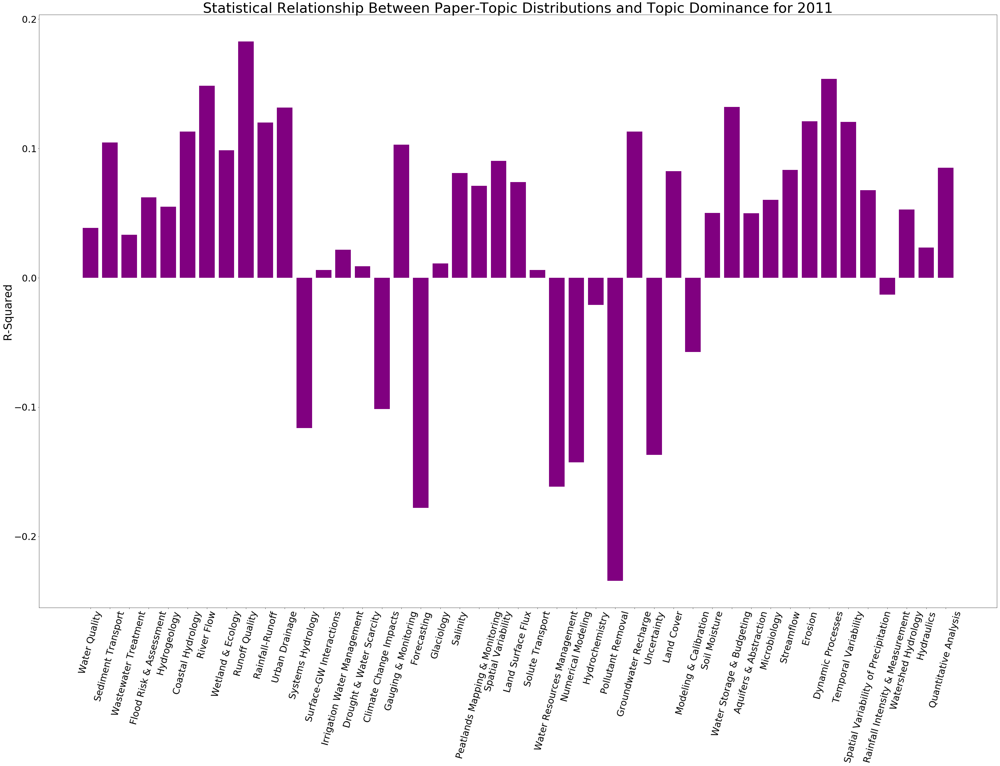

In [29]:
plt.figure(figsize=(55,35))
plt.xticks(size = 30, rotation = 75)
plt.yticks(size = 30)
plt.ylabel('R-Squared', size = 35)
plt.title('Statistical Relationship Between Paper-Topic Distributions and Topic Dominance for 2011', size = 45)
plt.bar(year_diversity_correlation_dict['shannon']['2011'].keys(),year_diversity_correlation_dict['shannon']['2011'].values(), color = 'purple')
 

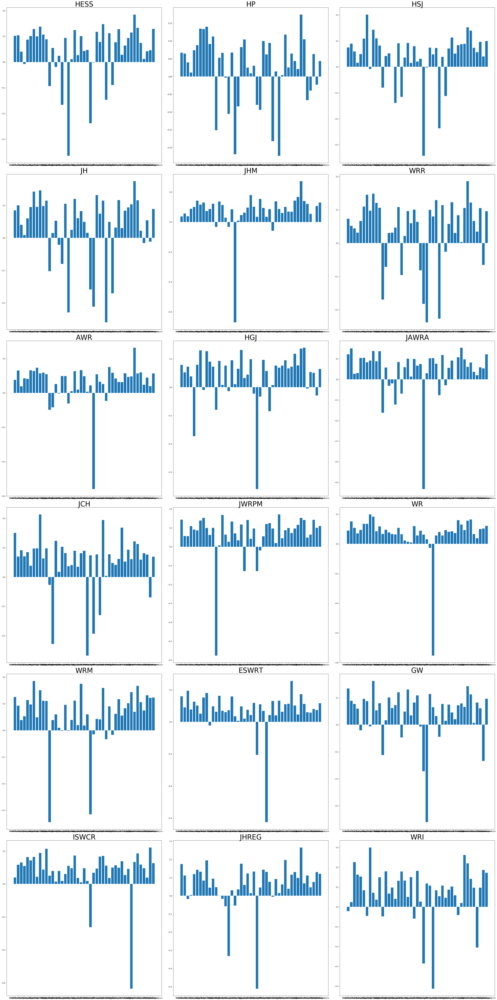

In [30]:
#shared x and y
#For journals gini
# Make the graph 20 inches by 40 inches
plt.figure(figsize=(40,80), facecolor='white')

# plot numbering starts at 1, not 0
plot_number = 1

for journal in journals:
    ax = plt.subplot(6, 3, plot_number)
    ax.bar(topic_names, journal_diversity_correlation_dict['gini-simpson'][journal].values())
    ax.set_title(journal, size = 40)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1

plt.tight_layout()

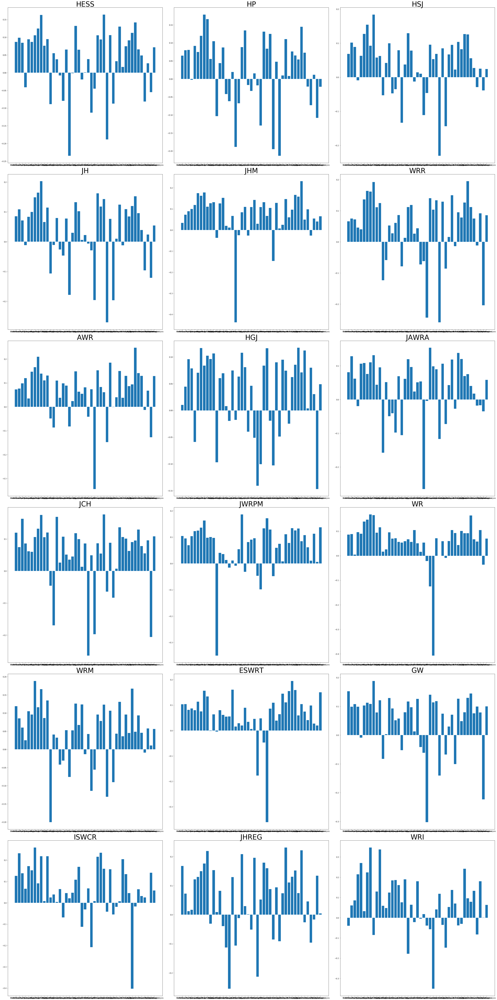

In [31]:
#For journals sprich
# Make the graph 20 inches by 40 inches
plt.figure(figsize=(40,80), facecolor='white')

# plot numbering starts at 1, not 0
plot_number = 1

for journal in journals:
    ax = plt.subplot(6, 3, plot_number)
    ax.bar(topic_names, journal_diversity_correlation_dict['spRich'][journal].values())
    ax.set_title(journal, size = 40)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1

plt.tight_layout()

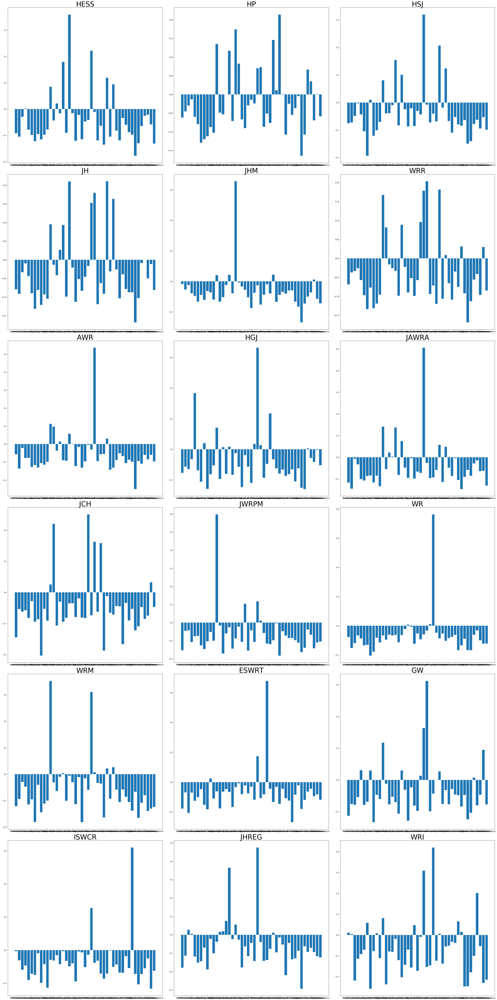

In [32]:
#For journals dominance
# Make the graph 20 inches by 40 inches
plt.figure(figsize=(40,80), facecolor='white')

# plot numbering starts at 1, not 0
plot_number = 1

for journal in journals:
    ax = plt.subplot(6, 3, plot_number)
    ax.bar(topic_names, journal_diversity_correlation_dict['dominance'][journal].values())
    ax.set_title(journal, size = 40)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1

plt.tight_layout()

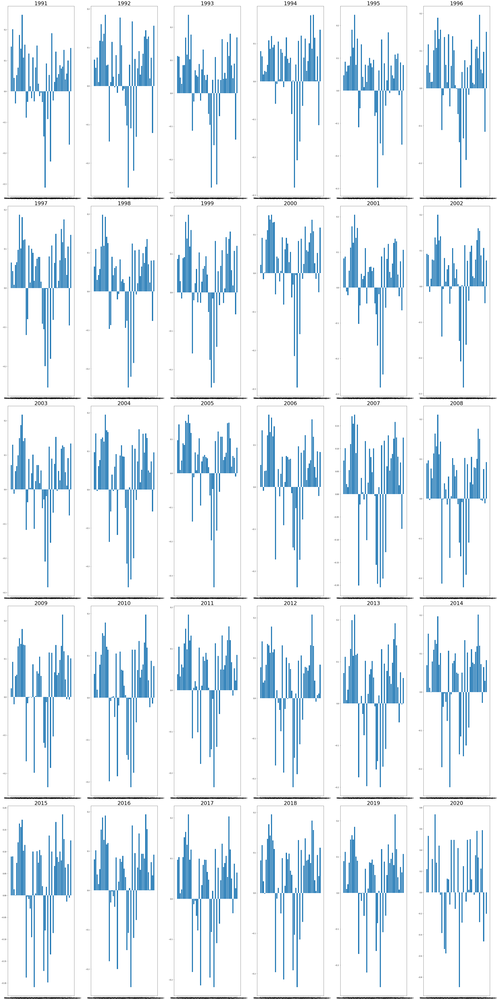

In [33]:
# for years shannon
# Make the graph 20 inches by 40 inches
plt.figure(figsize=(40,80), facecolor='white')

# plot numbering starts at 1, not 0
plot_number = 1

for year in years:
    ax = plt.subplot(5, 6, plot_number)
    ax.bar(topic_names, year_diversity_correlation_dict['shannon'][year].values())
    ax.set_title(year, size = 30)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1


plt.tight_layout()

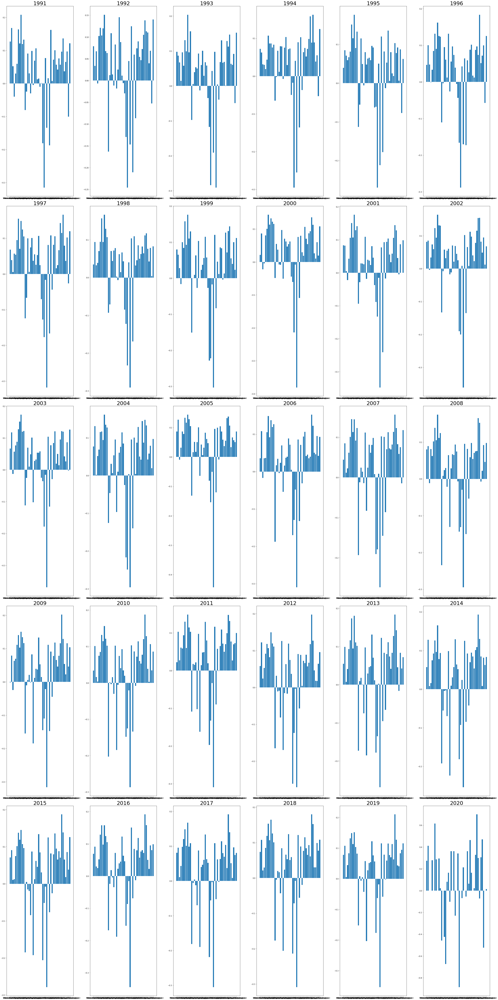

In [34]:
# for years gini
# Make the graph 20 inches by 40 inches
plt.figure(figsize=(40,80), facecolor='white')

# plot numbering starts at 1, not 0
plot_number = 1

for year in years:
    ax = plt.subplot(5, 6, plot_number)
    ax.bar(topic_names, year_diversity_correlation_dict['gini-simpson'][year].values())
    ax.set_title(year, size = 30)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1


plt.tight_layout()

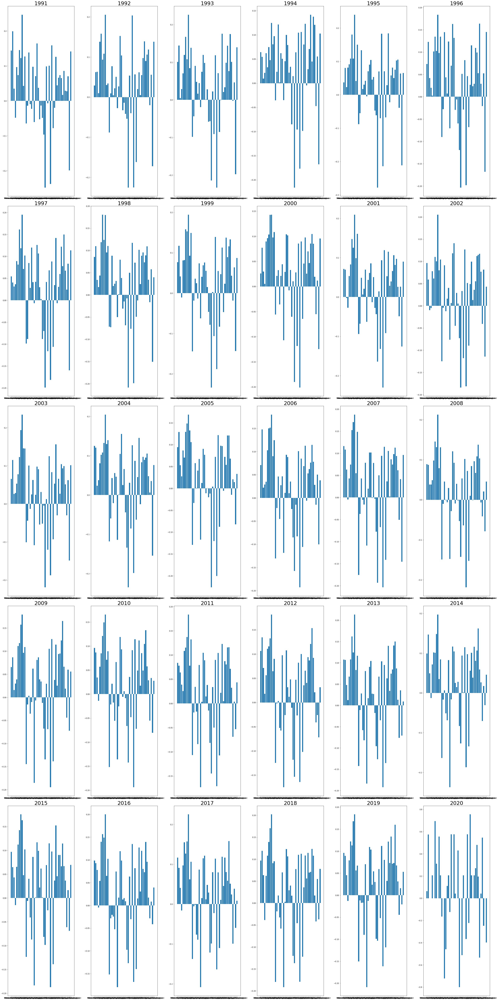

In [35]:
# for years sprich
# Make the graph 20 inches by 40 inches
plt.figure(figsize=(40,80), facecolor='white')

# plot numbering starts at 1, not 0
plot_number = 1

for year in years:
    ax = plt.subplot(5, 6, plot_number)
    ax.bar(topic_names, year_diversity_correlation_dict['spRich'][year].values())
    ax.set_title(year, size = 30)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1


plt.tight_layout()

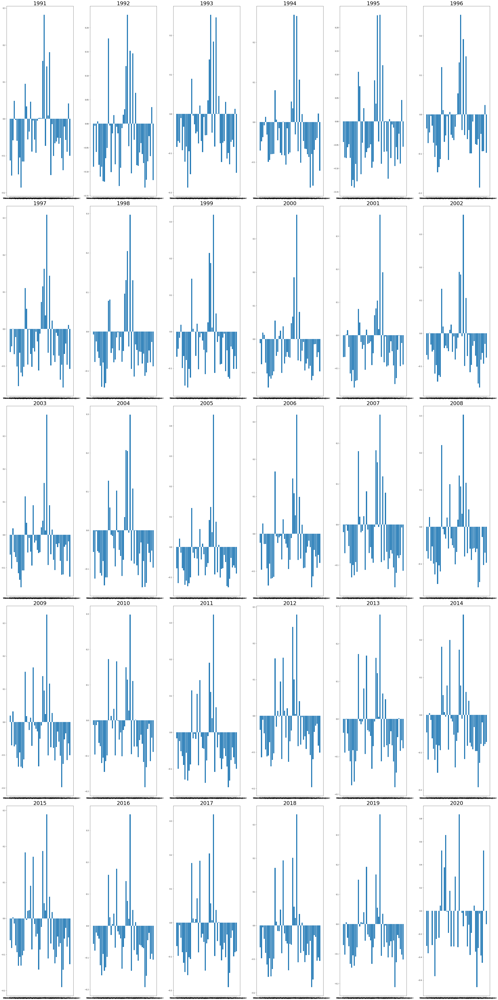

In [36]:
# for years dominance
# Make the graph 20 inches by 40 inches
plt.figure(figsize=(40,80), facecolor='white')

# plot numbering starts at 1, not 0
plot_number = 1

for year in years:
    ax = plt.subplot(5, 6, plot_number)
    ax.bar(topic_names, year_diversity_correlation_dict['dominance'][year].values())
    ax.set_title(year, size = 30)
    # Go to the next plot for the next loop
    plot_number = plot_number + 1


plt.tight_layout()